## Integrantes: Santiago Romero y Laura Ortiz

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split, KFold
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, f1_score

from google.colab import drive, files
import scipy.stats as stats
from scipy.stats import pointbiserialr, spearmanr
from scipy.stats import f_oneway

from patsy import dmatrix
from scipy.spatial import distance

# **PARTE 1**

# 1. Preparación de los datos

In [ ]:
spotify_data = pd.read_csv('Spotify_Song_Attributes.csv')

spotify_data.head()

,trackName,artistName,msPlayed,genre,danceability,energy,key,loudness,mode,speechiness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,"""Honest""",Nico Collins,191772,NaN,0.476,0.799,4.0,-4.939,0.0,0.2120,...,0.2570,0.577,162.139,audio_features,7dTxqsaFGHOXwtzHINjfHv,spotify:track:7dTxqsaFGHOXwtzHINjfHv,https://api.spotify.com/v1/tracks/7dTxqsaFGHOX...,https://api.spotify.com/v1/audio-analysis/7dTx...,191948.0,4.0
1,"""In The Hall Of The Mountain King"" from Peer G...",London Symphony Orchestra,1806234,british orchestra,0.475,0.130,7.0,-17.719,1.0,0.0510,...,0.1010,0.122,112.241,audio_features,14Qcrx6Dfjvcj0H8oV8oUW,spotify:track:14Qcrx6Dfjvcj0H8oV8oUW,https://api.spotify.com/v1/tracks/14Qcrx6Dfjvc...,https://api.spotify.com/v1/audio-analysis/14Qc...,150827.0,4.0
2,#BrooklynBloodPop!,SyKo,145610,glitchcore,0.691,0.814,1.0,-3.788,0.0,0.1170,...,0.3660,0.509,132.012,audio_features,7K9Z3yFNNLv5kwTjQYGjnu,spotify:track:7K9Z3yFNNLv5kwTjQYGjnu,https://api.spotify.com/v1/tracks/7K9Z3yFNNLv5...,https://api.spotify.com/v1/audio-analysis/7K9Z...,145611.0,4.0
3,$10,Good Morning,25058,experimental pop,0.624,0.596,4.0,-9.804,1.0,0.0314,...,0.1190,0.896,120.969,audio_features,3koAwrM1RO0TGMeQJ3qt9J,spotify:track:3koAwrM1RO0TGMeQJ3qt9J,https://api.spotify.com/v1/tracks/3koAwrM1RO0T...,https://api.spotify.com/v1/audio-analysis/3koA...,89509.0,4.0
4,(I Just) Died In Your Arms,Cutting Crew,5504949,album rock,0.625,0.726,11.0,-11.402,0.0,0.0444,...,0.0625,0.507,124.945,audio_features,4ByEFOBuLXpCqvO1kw8Wdm,spotify:track:4ByEFOBuLXpCqvO1kw8Wdm,https://api.spotify.com/v1/tracks/4ByEFOBuLXpC...,https://api.spotify.com/v1/audio-analysis/4ByE...,280400.0,4.0


In [ ]:
print(spotify_data.info())
print(spotify_data.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10080 entries, 0 to 10079
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   trackName         10080 non-null  object 
 1   artistName        10080 non-null  object 
 2   msPlayed          10080 non-null  int64  
 3   genre             8580 non-null   object 
 4   danceability      9530 non-null   float64
 5   energy            9530 non-null   float64
 6   key               9530 non-null   float64
 7   loudness          9530 non-null   float64
 8   mode              9530 non-null   float64
 9   speechiness       9530 non-null   float64
 10  acousticness      9530 non-null   float64
 11  instrumentalness  9530 non-null   float64
 12  liveness          9530 non-null   float64
 13  valence           9530 non-null   float64
 14  tempo             9530 non-null   float64
 15  type              9530 non-null   object 
 16  id                9530 non-null   object

In [ ]:
spotify_data.isnull().sum()
spotify_data = spotify_data.dropna()

In [ ]:
unique_genres = spotify_data['genre'].unique()
num_genres = len(unique_genres)

print(f'Hay {num_genres} géneros diferentes en el conjunto de datos.')

Hay 523 géneros diferentes en el conjunto de datos.


Podemos observar que hay un total de 10080 canciones y 523 géneros diferentes.

## Análisis de las variables:

Nuestras características de las canciones de interes son las siguientes:
- **danceability:**	A measure of how suitable a track is for dancing.
- **energy:**	The energy level of the track.
- **loudness:**	The overall loudness of the track in decibels (dB).
- **speechiness:**	The presence of spoken words in the track.
- **acousticness:**	The acousticness of the track.
- **instrumentalness:**	The probability of the track being instrumental.
- **liveness:**	A measure of the presence of a live audience in the track.
- **valence:**	The musical positiveness or happiness conveyed by the track.
- **tempo:**	The tempo of the track in beats per minute (BPM).

In [ ]:
features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

### Relaciones entre las características y el género:

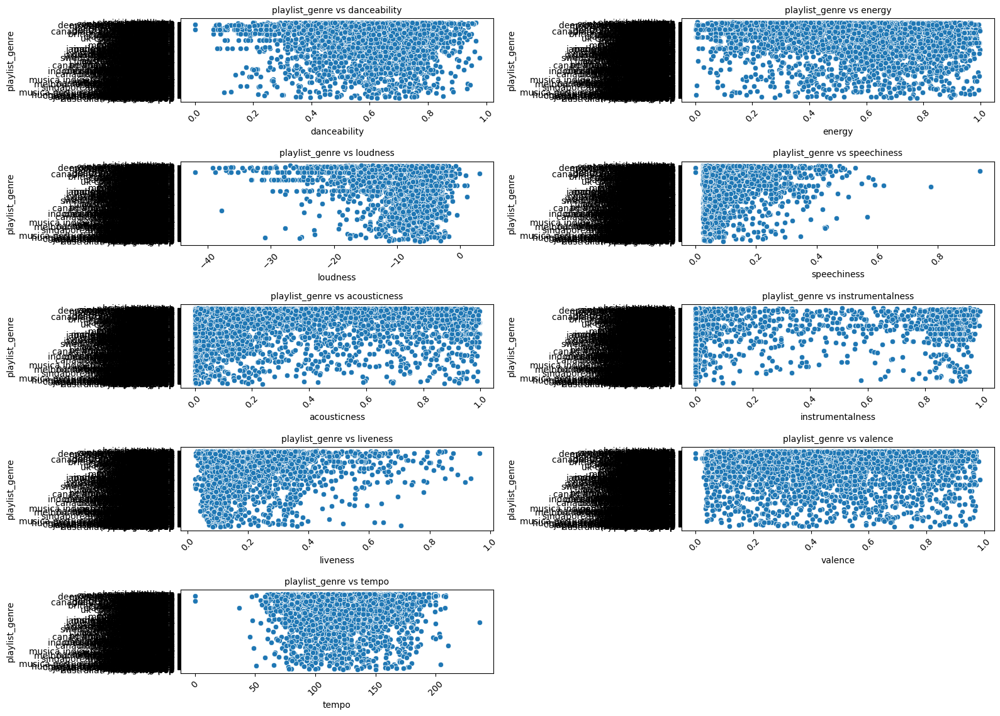

In [ ]:
plt.figure(figsize=(16, 20))

for i, col in enumerate(features, start=1):
    plt.subplot(len(features), 2, i)
    sns.scatterplot(x=spotify_data[col], y=spotify_data['genre'])
    plt.title(f'playlist_genre vs {col}', fontsize=10)
    plt.xlabel(col)
    plt.ylabel('playlist_genre')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Distribución de las características:

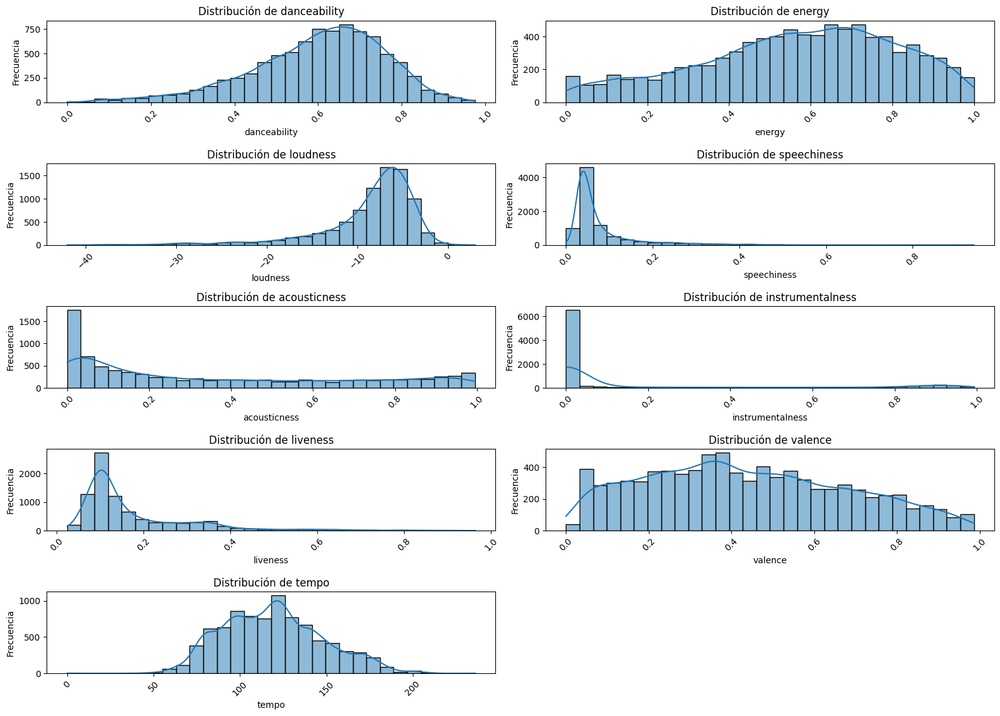

In [ ]:
plt.figure(figsize=(16, 20))

for i, col in enumerate(features, start=1):
    plt.subplot(len(features), 2, i)
    sns.histplot(spotify_data[col], kde=True, bins=30)
    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Identificar relaciones no lineales:

Vamos a hacer uso del coeficiente de correlación de Spearman.

In [ ]:
# Codificar la variable 'genre'
spotify_data['genre_code'] = spotify_data['genre'].astype('category').cat.codes

In [ ]:
spearman_correlations = []

for feature in features:
    coef, _ = spearmanr(spotify_data[feature], spotify_data['genre_code'])
    spearman_correlations.append({
        'Feature': feature,
        'Spearman Correlation': coef,
    })

df_spearman = pd.DataFrame(spearman_correlations)
df_spearman

,Feature,Spearman Correlation
0,danceability,0.058048
1,energy,-0.014873
2,loudness,0.039859
3,speechiness,0.003409
4,acousticness,0.019954
5,instrumentalness,-0.053689
6,liveness,-0.023540
7,valence,0.005091
8,tempo,-0.013575


Bajo la correlación uno a uno contra el genero de nuestras variables escogidas, podemos asumir que no existe una correlación fuerte para que una sola variable pueda predecir el genero, sin embargo vamos a verlo mejor en las graficas más adelante.

### Dividir los datos:

In [ ]:
X = spotify_data[features]
y = spotify_data['genre_code']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 2. Definición de kernels y distancias

## Funciones de kernels a usar:

Vamos a hacer uso de KNeighborsClassifier con las distancias Euclidiana y Manhattan, y de los kernels Epanechnikov, Gausiano y Tricúbico.

### KNeighborsClassifier:

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

def evaluate_knn(X_train, X_val, y_train, y_val, k_values, metric):
    results = []

    for k in k_values:
        knn = KNeighborsClassifier(n_neighbors=k, weights='distance', metric=metric)
        knn.fit(X_train, y_train)
        predictions = knn.predict(X_val)
        predictions = np.round(predictions).astype(int)

        mse = np.sqrt(mean_squared_error(y_val, predictions))
        mae = mean_absolute_error(y_val, predictions)
        r2 = r2_score(y_val, predictions)
        f1 = f1_score(y_val, predictions, average='weighted')

        results.append({
            "k": k,
            "RMSE": mse,
            "MAE": mae,
            "R2": r2,
            "F1": f1
        })

    return pd.DataFrame(results)

def knn_predict(k, X_train, y_train, x, feature, metric):
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance', metric=metric)
    knn.fit(X_train[:, [feature_index]], y_train)
    return knn.predict(x.reshape(1, -1))[0]

def plot_knn_predictions(X_train, y_train, feature, k_values, metric):
    plt.figure(figsize=(14, 8))
    plt.scatter(X_train[:, feature_index], y_train, label='Datos de entrenamiento', alpha=0.5, color='skyblue')
    plt.title(f'{feature} vs. Genre')
    plt.xlabel(feature)
    plt.ylabel('Genre')

    xgrid = np.linspace(X_train[:, feature_index].min(), X_train[:, feature_index].max(), 100)

    for k in k_values:
        y_knn = np.array([knn_predict(k, X_train, y_train, x, feature, metric) for x in xgrid])
        plt.plot(xgrid, y_knn, label=f'k-NN (k={k})')

    plt.legend()
    plt.tight_layout()
    plt.show()

### Epanechnikov, Gausiano y Tricúbico:

In [ ]:
def Epanechnikov(lmbda: float, point: np.ndarray, data_x: np.ndarray, data_y: np.ndarray) -> float:
    t = np.linalg.norm(data_x - point, axis=1) / lmbda
    k = np.where(t <= 1, 0.75 * (1 - t**2), 0)
    return np.dot(k, data_y) / k.sum() if k.sum() != 0 else 0

def Gaussian(lmbda: float, point: float, data_x: np.ndarray, data_y: np.ndarray) -> float:
    distances = np.linalg.norm(data_x - point, axis=1) / lmbda
    k = (1 / np.sqrt(2 * np.pi)) * np.exp(-0.5 * distances**2)
    return np.dot(k, data_y) / k.sum() if k.sum() != 0 else 0

def Tricubic(lmbda: float, point: float, data_x: np.ndarray, data_y: np.ndarray) -> float:
    distances = np.linalg.norm(data_x - point, axis=1) / lmbda
    k = np.where(distances <= 1, (1 - distances**3)**3, 0)
    return np.dot(k, data_y) / k.sum() if k.sum() != 0 else 0

In [ ]:
def evaluate_kernel(X_train, X_val, y_train, y_val, lmbda_values, kernel_function):
    results = []

    for lmbda in lmbda_values:
        predictions = [kernel_function(lmbda, x, X_train, y_train) for x in X_val]
        predictions = np.round(predictions).astype(int)

        rmse = np.sqrt(mean_squared_error(y_val, predictions))
        mae = mean_absolute_error(y_val, predictions)
        r2 = r2_score(y_val, predictions)
        f1 = f1_score(y_val, predictions, average='weighted')

        results.append({
            "lambda": lmbda,
            "RMSE": rmse,
            "MAE": mae,
            "R2": r2,
            "F1": f1
        })

    return pd.DataFrame(results)

def plot_kernel_predictions(X_train, y_train, feature, lmbda_values, kernels):
    features = X_train.shape[1]
    fig, axs = plt.subplots(1, len(kernels), figsize=(20, 6), sharey=True)
    xgrid = np.linspace(X_train[:, feature_index].min(), X_train[:, feature_index].max(), 100)

    for ax, (kernel_function, kernel_name) in zip(axs, kernels):
        ax.scatter(X_train[:, feature_index], y_train, label='Datos de entrenamiento', alpha=0.5, color='skyblue')
        ax.set_title(f'{feature} vs. Genre\n({kernel_name} Kernel)')
        ax.set_xlabel(feature)
        if ax == axs[0]:
            ax.set_ylabel('Genre')

        for lmbda in lmbda_values:
            y_kernel = np.array([kernel_function(lmbda, x, X_train, y_train) for x in xgrid])
            ax.plot(xgrid, y_kernel, label=f'λ={lmbda}')

        ax.legend()

    plt.tight_layout()
    plt.show()

# 3. Construcción y evaluación de los modelos

In [ ]:
k_values = [50, 80, 100, 200, 400]

In [ ]:
results_euclidean = evaluate_knn(X_train, X_val, y_train, y_val, k_values, metric='euclidean')
results_manhattan = evaluate_knn(X_train, X_val, y_train, y_val, k_values, metric='manhattan')

print("Resultados knn con métrica Euclidiana:")
print(results_euclidean)

print("\nResultados knn con métrica Manhattan:")
print(results_manhattan)

Resultados knn con métrica Euclidiana:
     k        RMSE        MAE        R2        F1
0   50   99.102923  33.911422  0.586336  0.802536
1   80  104.389992  36.184149  0.541021  0.809028
2  100  106.860665  36.889277  0.519038  0.810378
3  200  110.583012  38.912587  0.484947  0.814782
4  400  111.104405  39.715618  0.480079  0.813548

Resultados knn con métrica Manhattan:
     k        RMSE        MAE        R2        F1
0   50  106.040224  37.324009  0.526395  0.803790
1   80  102.635225  35.637529  0.556322  0.810151
2  100  103.980964  35.672494  0.544611  0.814692
3  200  106.952024  37.175991  0.518215  0.814306
4  400  107.470937  37.242424  0.513529  0.817480


Podemos notar que para el caso de KNN tanto en la distancia Euclideana como en la Manhattan, las métricas bajan a medida que aumenta el número de vecinos. Para el caso de Euclideana el mejor K por el momento es 50, mientras que para Manhattan es 80.

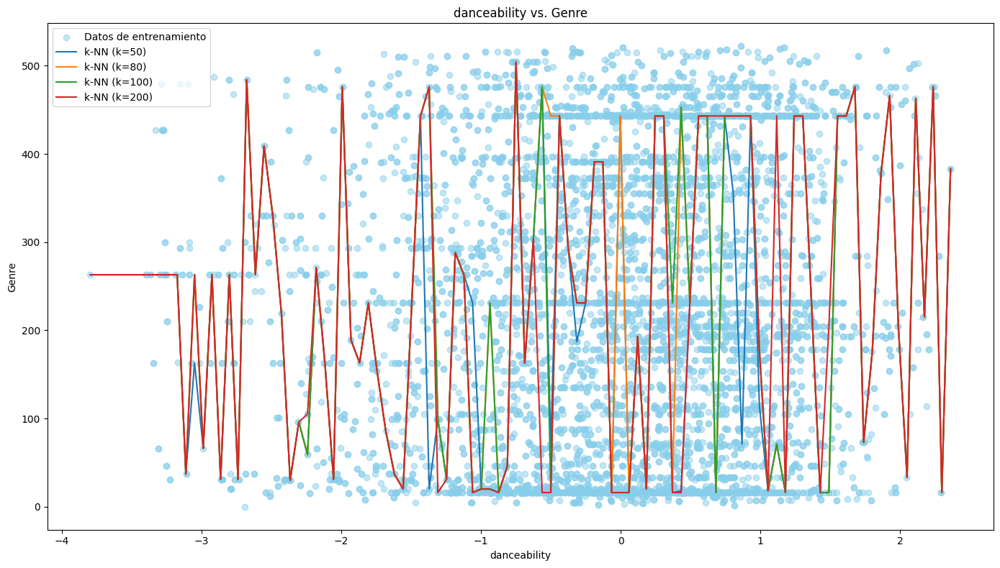

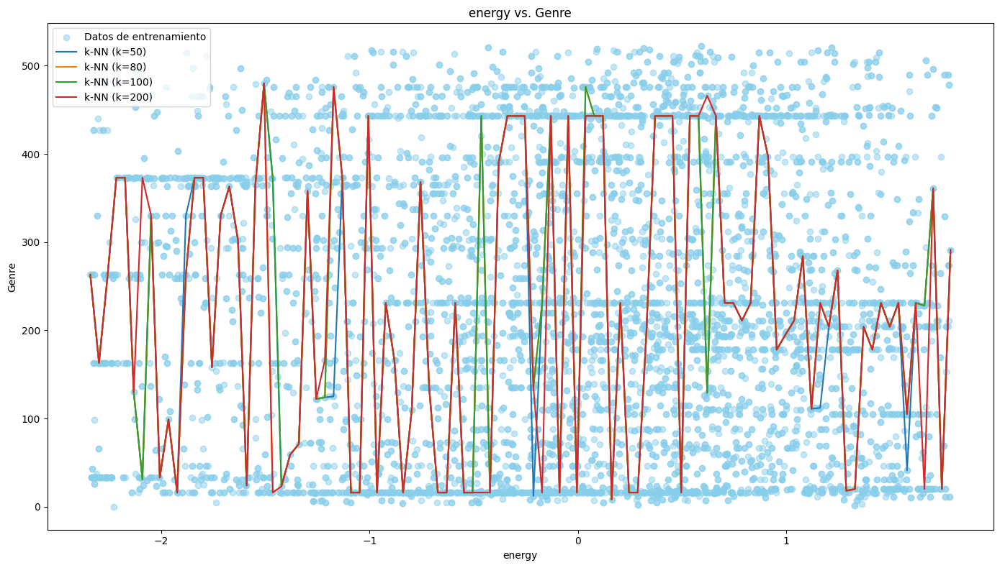

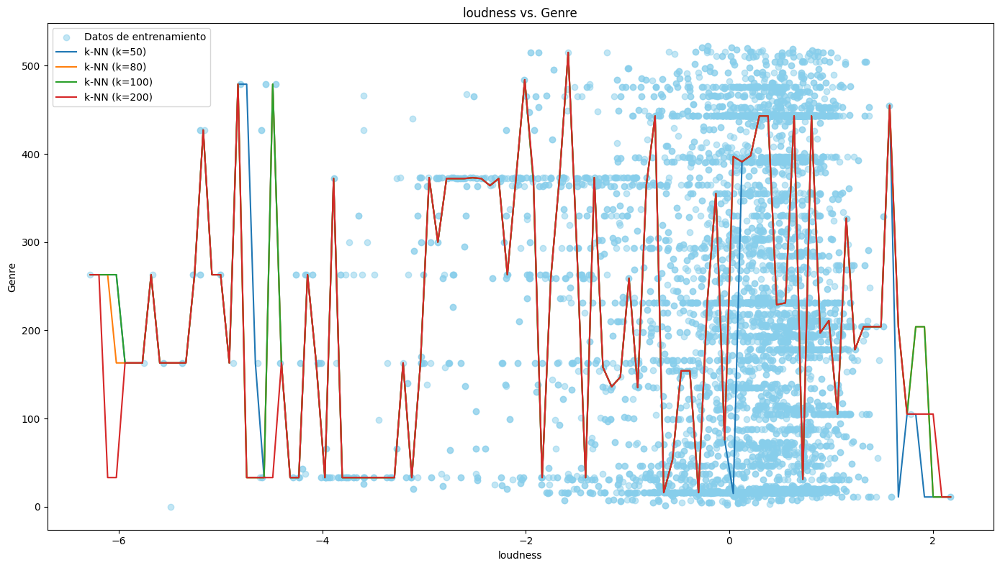

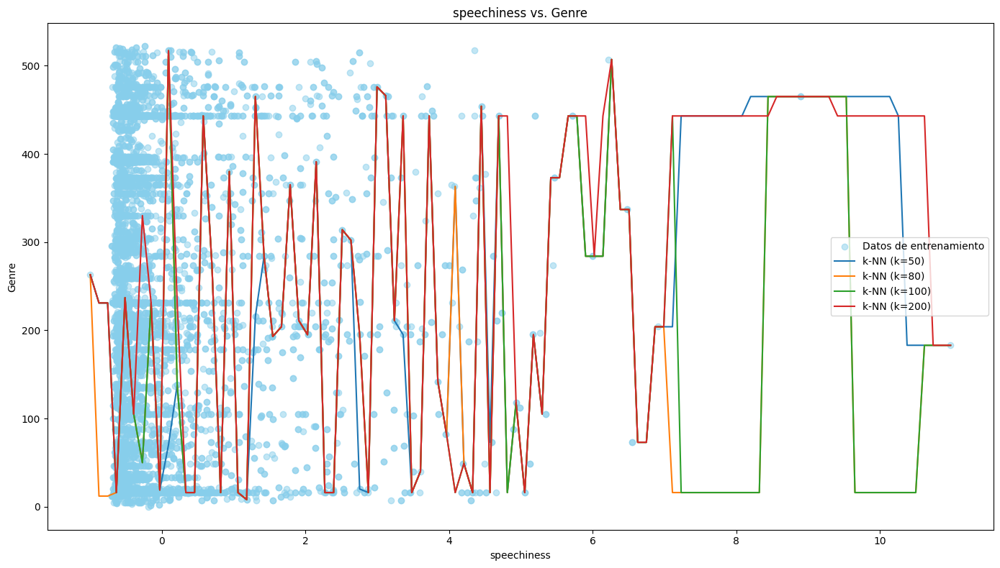

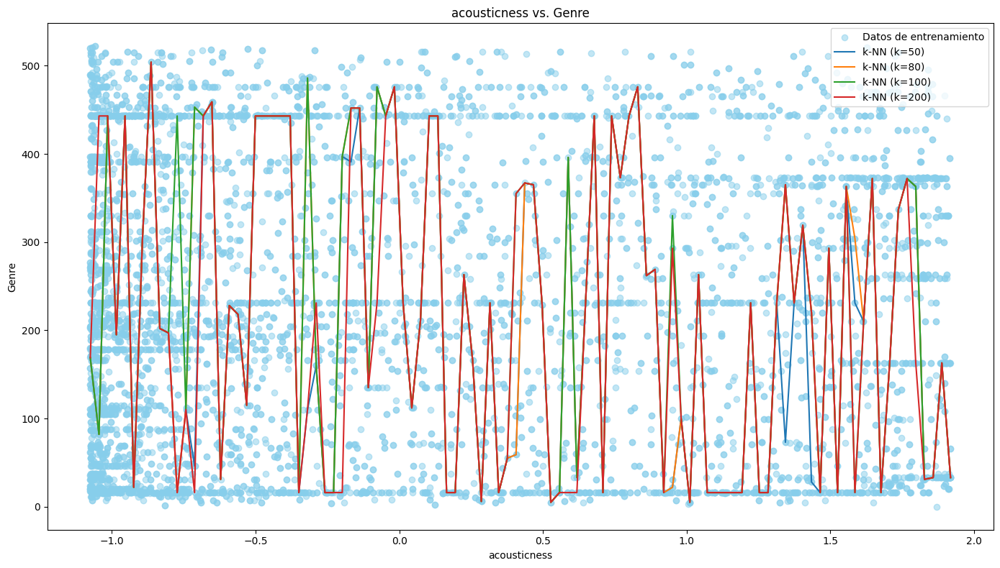

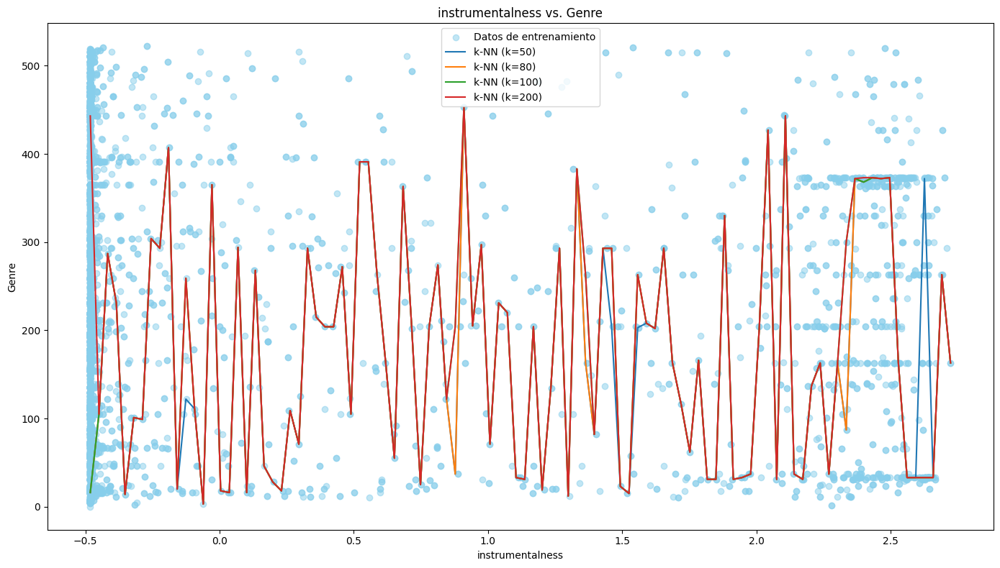

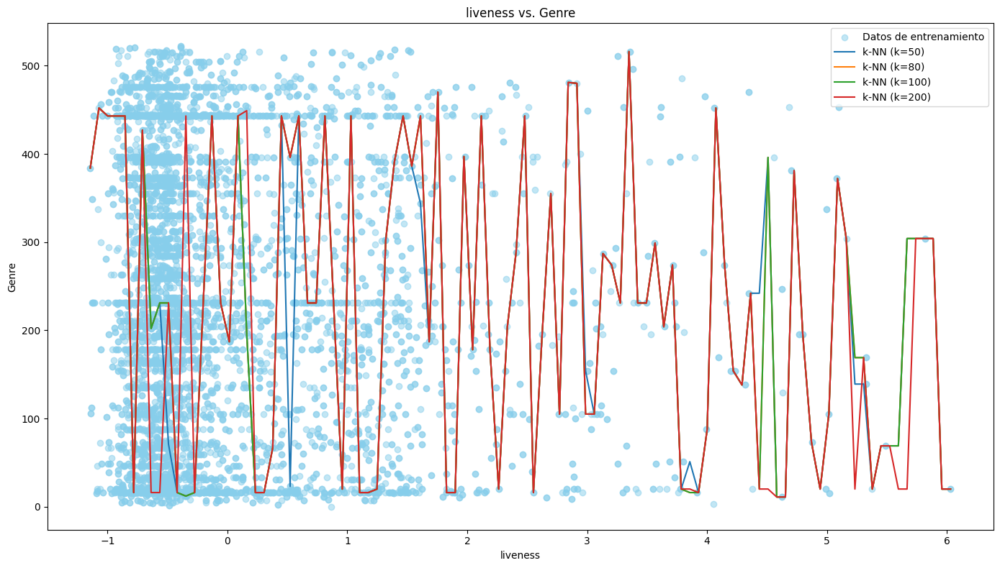

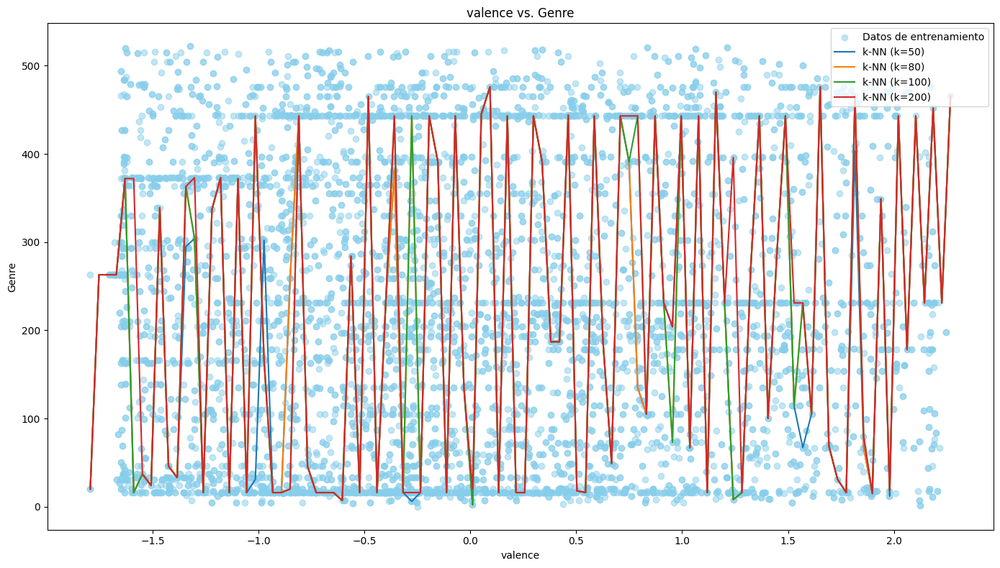

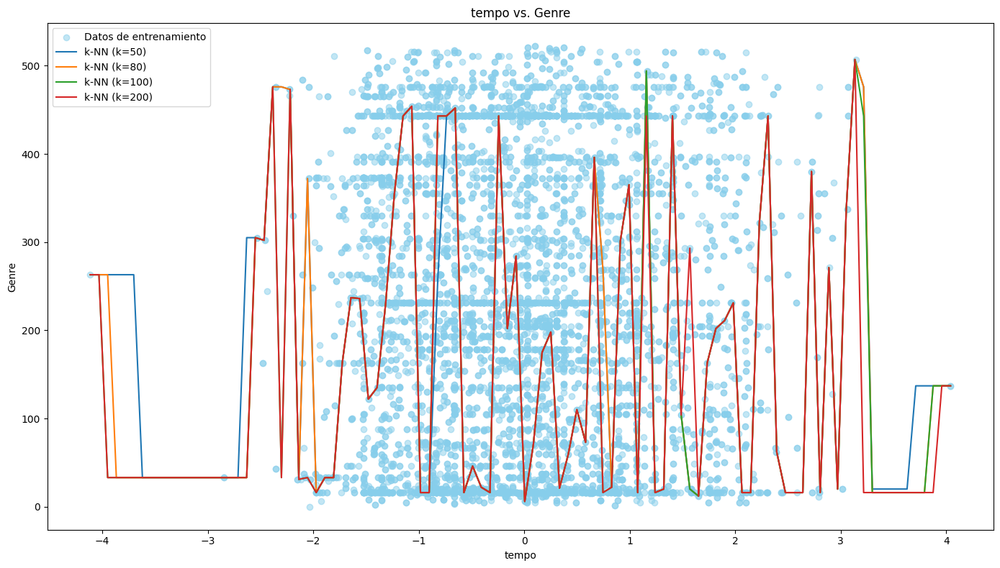

In [ ]:
for feature_index, feature in enumerate(features):
    plot_knn_predictions(X_train, y_train, feature, k_values, metric='euclidean')

Estas graficas nos demuestran que el kernel en una sola dimención no es capaz de explicar los datos ni mucho menos de predecir los generos, es por eso que tomamos más dimenciones, sin embargo toca tener en cuenta que no se puede graficar mas de dos dimenciones ergo no vamos a graficar algo que realmente explique.

In [ ]:
lmbda_values = [0.001, 0.05, 0.5, 1]

In [ ]:
results_epanechnikov = evaluate_kernel(X_train, X_val, y_train, y_val, lmbda_values, Epanechnikov)
results_gaussian = evaluate_kernel(X_train, X_val, y_train, y_val, lmbda_values, Gaussian)
results_tricubic = evaluate_kernel(X_train, X_val, y_train, y_val, lmbda_values, Tricubic)

print("Resultados con kernel Epanechnikov:")
print(results_epanechnikov)

print("\nResultados con kernel Gaussiano:")
print(results_gaussian)

print("\nResultados con kernel Tricúbico:")
print(results_tricubic)

Resultados con kernel Epanechnikov:
   lambda        RMSE        MAE        R2        F1
0   0.001  135.564876  53.236597  0.225949  0.859860
1   0.050  135.564876  53.236597  0.225949  0.859860
2   0.500  132.330058  55.439977  0.262449  0.770002
3   1.000  136.776011  95.269231  0.212057  0.241057

Resultados con kernel Gaussiano:
   lambda        RMSE         MAE        R2        F1
0   0.001  135.564876   53.236597  0.225949  0.859860
1   0.050   92.378141   33.287296  0.640571  0.801038
2   0.500  128.741678  102.264569  0.301907  0.028353
3   1.000  149.817632  127.473193  0.054632  0.003035

Resultados con kernel Tricúbico:
   lambda        RMSE        MAE        R2        F1
0   0.001  135.564876  53.236597  0.225949  0.859860
1   0.050  135.564876  53.236597  0.225949  0.859860
2   0.500  131.581159  52.867133  0.270774  0.783475
3   1.000  127.701187  81.210956  0.313145  0.267710


Para el caso de los kernel, las métricas varían un poco más, pero se pueden notar mejores métricas entre los lambdas 0.05 y 0.5. Pero en general por el momento podemos ver que el kernel Gausiano con 0.05 obtiene buenos resultados.

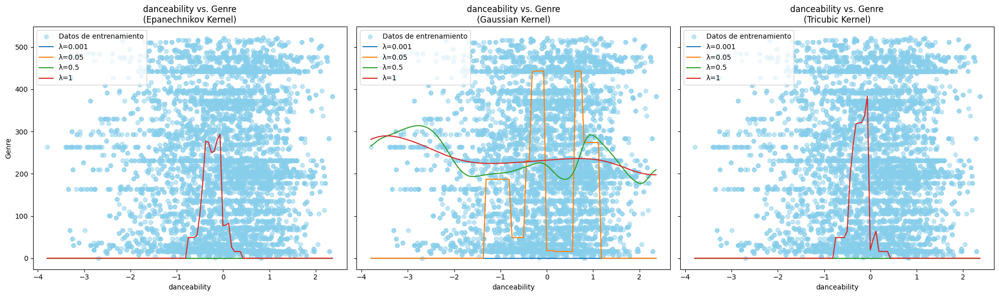

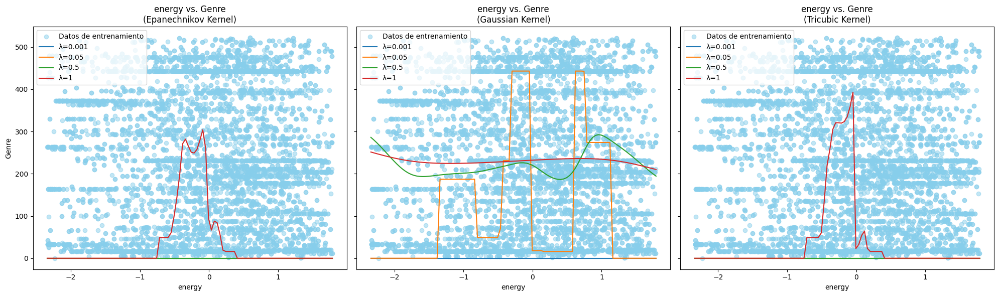

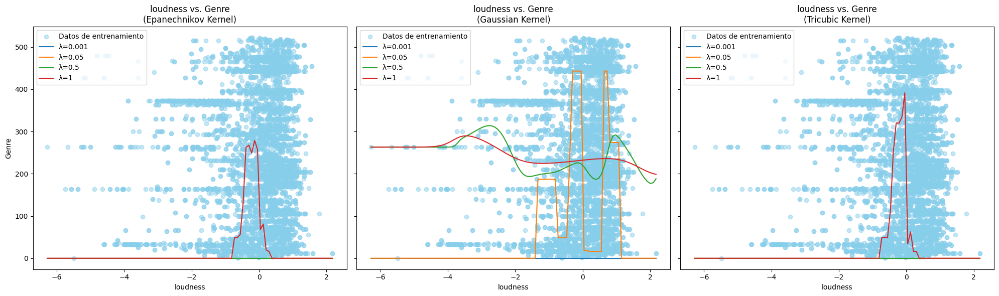

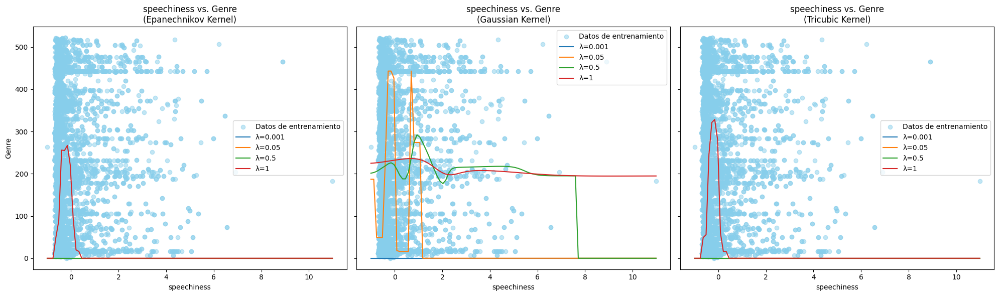

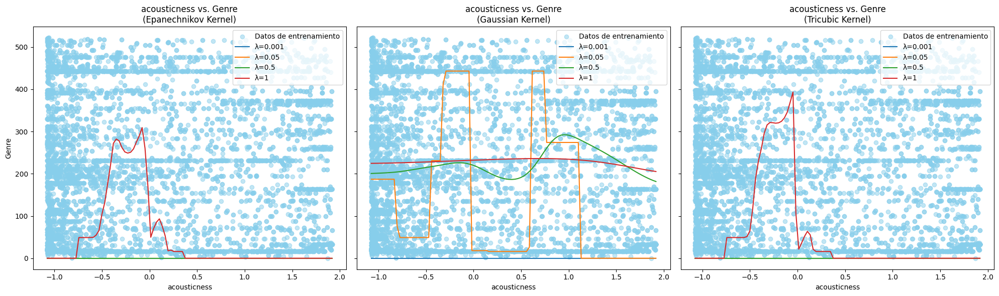

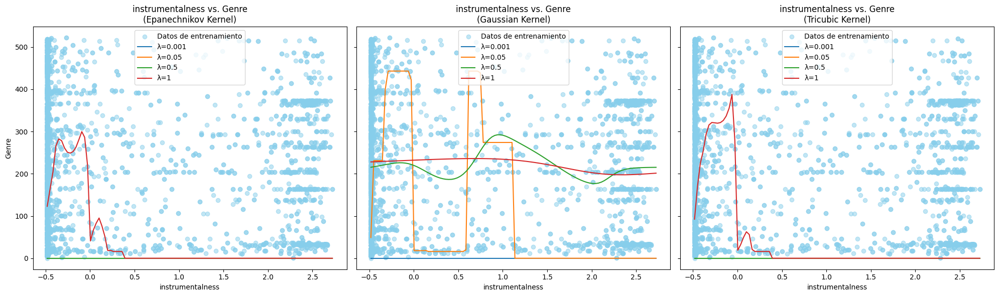

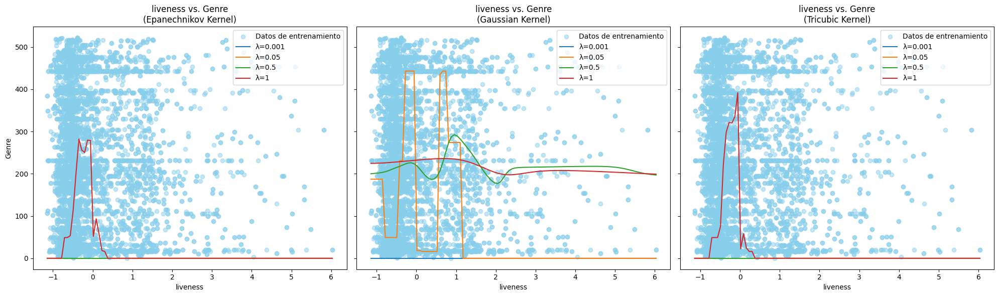

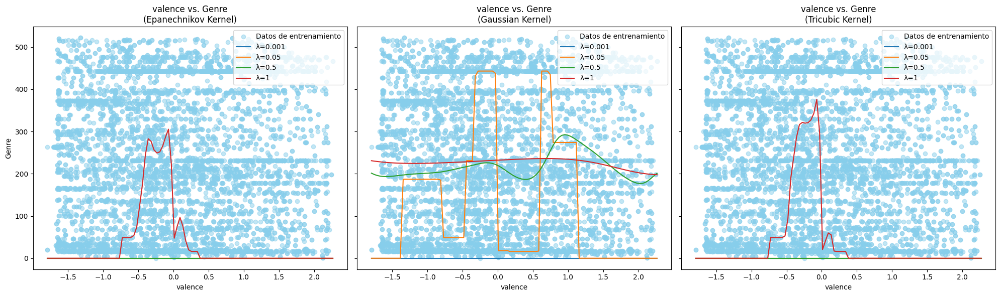

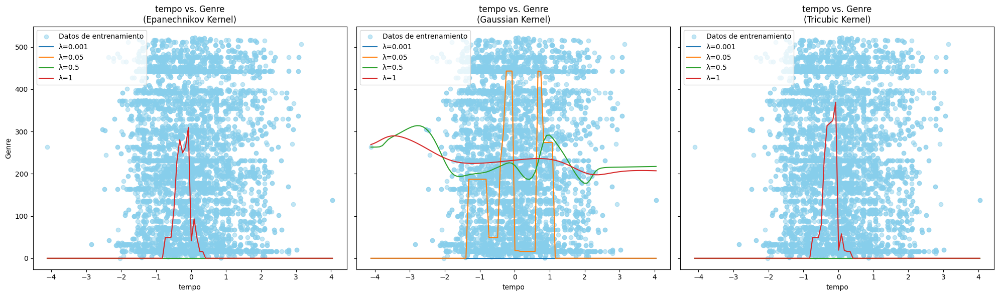

In [ ]:
kernels = [
    (Epanechnikov, "Epanechnikov"),
    (Gaussian, "Gaussian"),
    (Tricubic, "Tricubic")
]

for feature_index, feature in enumerate(features):
    plot_kernel_predictions(X_train, y_train, feature, lmbda_values, kernels)

Al igual que con Knn estas graficas no van a dar un resultado concluso, ya que no son lo suficientemente fuertes y no existe la suficiente correlación para entenderla con genero.

# 4. Validación Cruzada

In [ ]:
def cross_validate_knn(X, y, k_values, metric, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    results = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        fold_results = evaluate_knn(X_train, X_val, y_train, y_val, k_values, metric)
        results.append(fold_results)

    return pd.concat(results).groupby('k').mean().reset_index()

In [ ]:
results_euclidean_cv = cross_validate_knn(X_scaled, y, k_values, metric='euclidean')
results_manhattan_cv = cross_validate_knn(X_scaled, y, k_values, metric='manhattan')

print("Resultados knn con métrica Euclidiana:")
print(results_euclidean_cv)

print("\nResultados knn con métrica Manhattan:")
print(results_manhattan_cv)

Resultados knn con métrica Euclidiana:
     k        RMSE        MAE        R2        F1
0   50   96.392109  31.898601  0.625179  0.826942
1   80   98.169705  32.575524  0.610677  0.830146
2  100   99.534858  33.267366  0.599481  0.829318
3  200  102.851582  34.720979  0.572368  0.831035
4  400  105.704491  36.287646  0.548877  0.830639

Resultados knn con métrica Manhattan:
     k        RMSE        MAE        R2        F1
0   50   98.475028  32.880653  0.607730  0.826662
1   80   98.338294  32.808159  0.609559  0.829359
2  100   98.871877  32.852914  0.605181  0.830688
3  200  102.477854  34.579021  0.576066  0.831958
4  400  105.546882  35.968765  0.550849  0.832427


Según los resultados, podemos ver que k = 50 proporciona buen rendimiento para las distancias euclidianas y de Manhattan en las métricas. Aunque para Manhattan se podría considerar mejor k = 80. Esto sugiere que considerar un número relativamente menor de vecinos ayuda a capturar patrones y detalles más relevantes en los datos.

- Comparación de métricas: Tanto las métricas euclidianas como las de Manhattan muestran tendencias similares, pero la métrica euclidiana funciona ligeramente mejor con RMSE y MAE más bajos en el valor de k más óptimo.

- Estabilidad del modelo: la puntuación F1 se mantiene relativamente estable en diferentes valores k, lo que indica que el modelo mantiene un buen equilibrio entre precisión y recuperación.

In [ ]:
best_k = results_euclidean_cv.loc[results_euclidean_cv['RMSE'].idxmin()]['k']
print("Best k for Euclidean:", best_k)

best_k = results_manhattan_cv.loc[results_manhattan_cv['RMSE'].idxmin()]['k']
print("Best k for Manhattan:", best_k)

Best k for Euclidean: 50.0
Best k for Manhattan: 80.0


In [ ]:
def cross_validate_kernels(X, y, lmbda_values, kernel_function, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    results = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        fold_results = evaluate_kernel(X_train, X_val, y_train, y_val, lmbda_values, kernel_function)
        results.append(fold_results)

    return pd.concat(results).groupby('lambda').mean().reset_index()

In [ ]:
results_epanechnikov_cv = cross_validate_kernels(X_scaled, y, lmbda_values, Epanechnikov)
results_gaussian_cv = cross_validate_kernels(X_scaled, y, lmbda_values, Gaussian)
results_tricubic_cv = cross_validate_kernels(X_scaled, y, lmbda_values, Tricubic)

print("Resultados con kernel Epanechnikov:")
print(results_epanechnikov_cv)

print("\nResultados con kernel Gaussiano:")
print(results_gaussian_cv)

print("\nResultados con kernel Tricúbico:")
print(results_tricubic_cv)

Resultados con kernel Epanechnikov:
   lambda        RMSE        MAE        R2        F1
0   0.001  121.655038  44.029604  0.398877  0.874238
1   0.050  121.655038  44.029604  0.398877  0.874238
2   0.500  117.713234  46.197203  0.436609  0.784037
3   1.000  131.641390  92.388928  0.300648  0.254097

Resultados con kernel Gaussiano:
   lambda        RMSE         MAE        R2        F1
0   0.001  121.655038   44.029604  0.398877  0.874238
1   0.050   93.662630   32.283916  0.646604  0.822629
2   0.500  130.435531  104.327855  0.314487  0.033477
3   1.000  153.011555  131.460839  0.056877  0.004596

Resultados con kernel Tricúbico:
   lambda        RMSE        MAE        R2        F1
0   0.001  121.655038  44.029604  0.398877  0.874238
1   0.050  121.655038  44.029604  0.398877  0.874238
2   0.500  116.361197  43.350117  0.449037  0.800070
3   1.000  120.556905  76.897319  0.412886  0.286822


Valores de lambda de 0,001 y 0,05 tanto para los kernels Epanechnikov como para Tricubic, las métricas de rendimiento son idénticas en estos valores bajos. Esto sugiere que los kernels no suavizan los datos.

Por otro lado lambda de 0,5 proporciona un mejor equilibrio para los kernels Epanechnikov y Tricubic, mejorando el R² y RMSE, lo que indica un mejor ajuste.

Con un lambda ya muy alto como 1 el rendimiento empeora significativamente para todos los kernels, con RMSE y MAE más altos y R² más bajo. Esto sugiere que los kernels son demasiado anchos, lo que provoca un suavizado excesivo y un ajuste insuficiente.

Comparación entre kernels:
- Kernel de Epanechnikov: Se desempeña moderadamente bien λ = 0,5 pero empeora significativamente a mayor lambda.

- Kernel Gaussiano: Muestra una mejora significativa en λ = 0,05, con el mejor comportamiento en términos de RMSE y R². Y el rendimiento empeora a medida que lambda aumenta.

- Núcleo tricúbico: Similar a Epanechnikov.

En cuanto al F1 score, que equilibra la precisión y la recuperación, es más alta en valores menores de lambda para todos los kernles, pero cae para los valores más altos de lambda. Esto sugiere que los valores bajos de lambda ayudan a mejorar el rendimiento de la clasificación, mientras que los valores más altos conducen a una discriminación deficiente.

Estas ideas sugieren que elegir una opción adecuada de λ es crucial para los métodos del kernel y la validación cruzada es esencial para encontrar el valor óptimo. El kernel gaussiano con λ = 0,05 parece particularmente eficaz en este caso, ya que proporciona el mejor equilibrio entre sesgo y varianza.

In [ ]:
best_lambda_gau = results_gaussian_cv.loc[results_gaussian_cv['RMSE'].idxmin()]['lambda']
print("Best lambda:", best_lambda_gau)

Best lambda: 0.05


# 5. Predicciones

Finalmente vamos a realizar algunas predicciones con los modelos más óptimos:

En este caso hicimos predicciones de 4 canciones, las 3 primeras tienen valores random de las características que elegimos. En el caso de la última son valores tomados de una canción del dataset que usamos, esto para ver que tan bien predice nuestros modelos.

In [ ]:
example_song = spotify_data.loc[1, features + ['genre']]
example_song

danceability                    0.475
energy                           0.13
loudness                      -17.719
speechiness                     0.051
acousticness                    0.916
instrumentalness                0.956
liveness                        0.101
valence                         0.122
tempo                         112.241
genre               british orchestra
Name: 1, dtype: object

In [ ]:
new_songs = pd.DataFrame({
    'danceability': [0.5, 0.7, 0.5, 0.475],
    'energy': [0.6, 0.8, 0.2, 0.13],
    'loudness': [-5.0, -3.0, -7.0, -17.719],
    'speechiness': [0.1, 0.2, 0.1, 0.051],
    'acousticness': [0.3, 0.1, 0.9, 0.916],
    'instrumentalness': [0.0, 0.0, 0.9, 0.956],
    'liveness': [0.2, 0.3, 0.1, 0.101],
    'valence': [0.5, 0.7, 0.2, 0.122],
    'tempo': [120.0, 130.0, 112.0, 112.241]
})

new_songs_scaled = scaler.transform(new_songs)

In [ ]:
best_k = 50
metric = 'euclidean'

knn_classifier = KNeighborsClassifier(n_neighbors=best_k, weights='distance', metric=metric)
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=50, weights='distance')

In [ ]:
best_k = 80
metric = 'manhattan'

knn_classifier2 = KNeighborsClassifier(n_neighbors=best_k, weights='distance', metric=metric)
knn_classifier2.fit(X_train, y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=80, weights='distance')

### Predicciones KNN con la distancia Euclideana:

In [ ]:
predicted_genres = knn_classifier.predict(new_songs_scaled)

genre_mapping = {code: genre for genre, code in spotify_data[['genre', 'genre_code']].drop_duplicates().values}

predicted_genre_names = [genre_mapping[code] for code in predicted_genres]
predicted_genre_names

['alt z', 'dance pop', 'anime lo-fi', 'british orchestra']

### Predicciones KNN con la distancia Manhattan:

In [ ]:
predicted_genres = knn_classifier2.predict(new_songs_scaled)

genre_mapping = {code: genre for genre, code in spotify_data[['genre', 'genre_code']].drop_duplicates().values}

predicted_genre_names = [genre_mapping[code] for code in predicted_genres]
predicted_genre_names

['pop', 'dance pop', 'lo-fi sleep', 'british orchestra']

### Predicciones con Kernel Gausiano

In [ ]:
best_lambda = 0.05

predictions_gaussian = [Gaussian(best_lambda, x, X_train, y_train) for x in new_songs_scaled]

predicted_genre_names = [genre_mapping[int(code)] for code in predictions_gaussian]
predicted_genre_names

['experimental pop', 'gaming edm', 'indie anthem-folk', 'british orchestra']

- Podemos observar que efectivamente los tres modelos predijeron correctamente el género "british orchestra" de la canción conocida del conjunto de datos. Esto indica que los modelos son capaces de reconocer y clasificar correctamente una canción con características similares a la que han visto durante el entrenamiento. Esta es una buena señal de la capacidad de los modelos para generalizar a partir de los datos de entrenamiento.

- Las predicciones para las tres canciones aleatorias varían entre los modelos. Esto es de esperar ya que cada modelo utiliza un enfoque diferente para clasificar las canciones.

  Aunque, por ejemplo la primera canción sus predicciones fueron "alt z", "pop" y "experimental pop". El género "alt z" (alternative Z) es un subgénero que ha emergido en la música popular, y a menudo se describe como una mezcla de varios estilos, incluyendo el pop. El alt z tiende a incorporar elementos más diversos y experimentales como el pop experimental, diferenciándose un poco de lo convencional del pop. El alt z y el pop experimental comparten varias características y pueden ser considerados cercanos en algunos aspectos.

  Por otro lado, la segunda canción los modelos de KNN predijeron el mismo género "dance pop" y el gausiano predijo "gaming edm", géneros que suelen tener un ritmo rápido y energético, y usan ampliamente la producción electrónica. Tanto el dance pop como el gaming EDM buscan crear un ambiente específico, ya sea para la pista de baile o para mejorar la experiencia de juego.

  Finalmente la tercera canción, los modelos KNN predijeron algo en común que es el lo-fi, un estilo de género tranquilo, en cuanto a gausiano la verdad no conocemos el género 😞
  
Por lo tanto, se podría decir que los resultados entre los modelos tienen alguna similitudes.